In [ ]:
!nvidia-smi

Wed Jul 14 13:34:20 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.42.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   52C    P8    10W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
!ls /mydrive

Mounted at /content/gdrive
'2018-19(Tushar Jain Pic a Speako coordinator ).pdf'
'2018-19(Tushar Jain poster competition atrangi).pdf'
'2018-19(Tushar Jain treasure hun Renaissance).pdf'
'2018-19(Tushar Jain volunteer poster competition).pdf'
'2019-20(Tishar jain cyberops infosec meriy certi).pdf'
'2019-20(Tushar Jain Cyberops Infosec training).pdf'
'2019-20(Tushar Jain hackathon jecrc).pdf'
'2019-20(Tushar Jain IIEC Workshop).pdf'
'3 sem C sec list.gsheet'
'business person.mp4'
'canappy stationary.gslides'
'CAO MTT2 TUSHAR JAIN 169 18EJCCS176 (1).pdf'
 certi
'Colab Notebooks'
'college fee.xlsx'
'Copy of Course 3 Week 1 Glossary | DA terms and definitions.gdoc'
'Copy of Data Journal: Journal Entry Templates.gdoc'
'Copy of Data Spreadsheet for "Cleaning with Spreadsheets" .gsheet'
'Copy of June 2014 Invoices.gsheet'
'Copy of Resume Template 1 (1).gdoc'
'Copy of Resume Template 1.gdoc'
'Copy of Resume Template 2.gdoc'
'Copy of VERIFY DATA CSE 2022 BATCH.xlsx'
'Debit card.jpg'
 documents
 

In [ ]:
from google.colab.patches import cv2_imshow
import cv2
import numpy as np

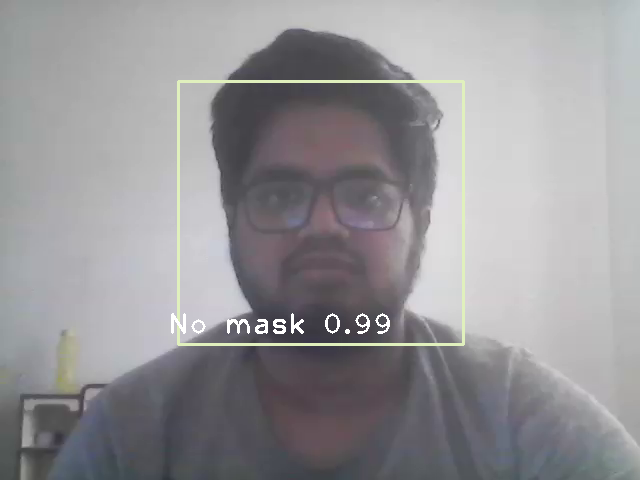

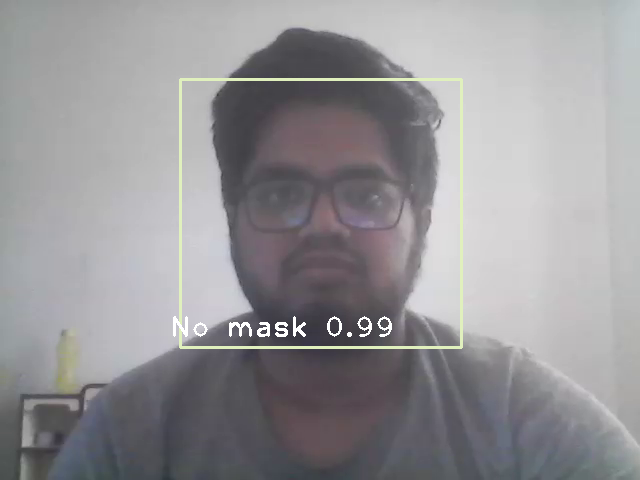

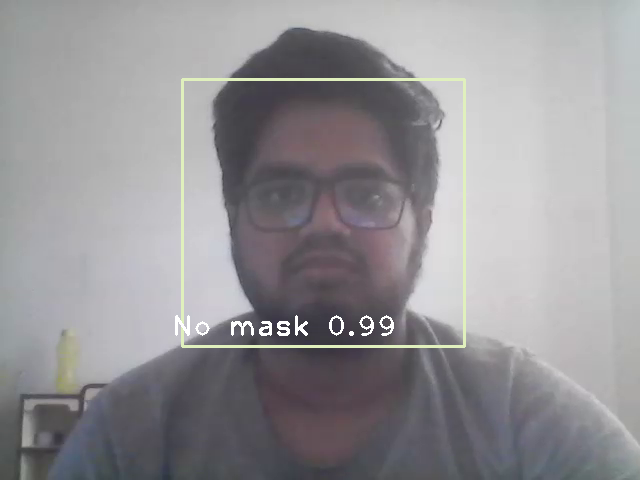

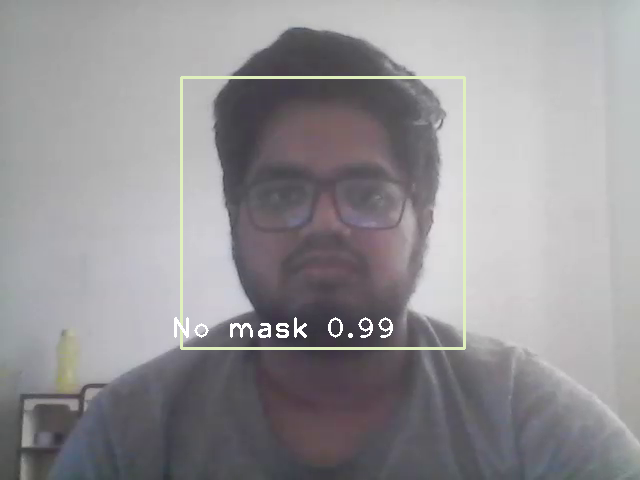

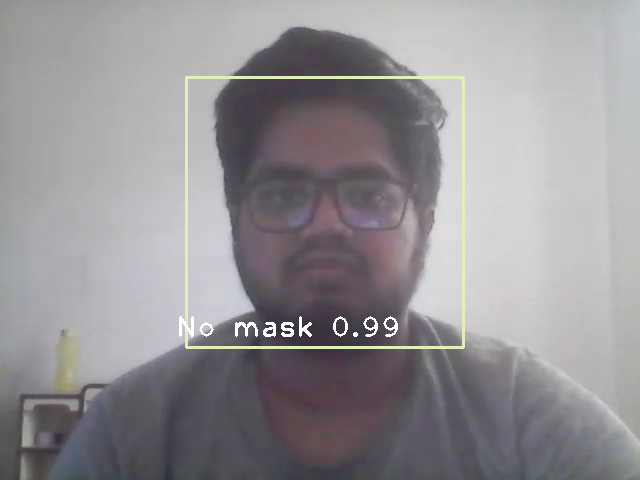

...

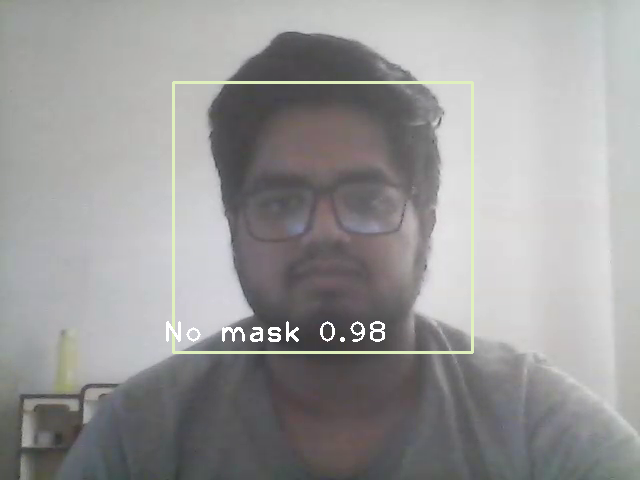

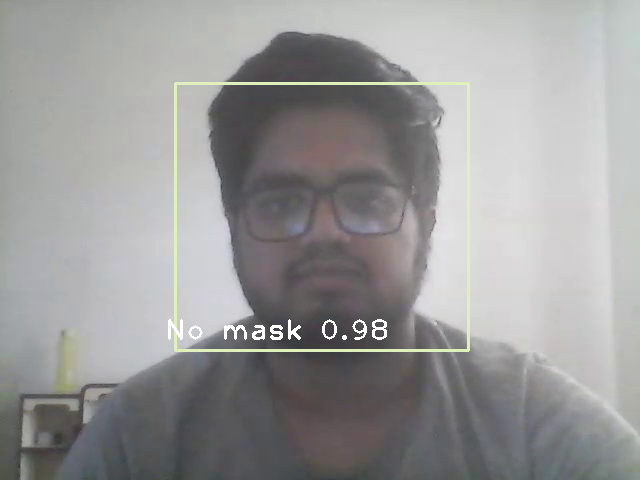

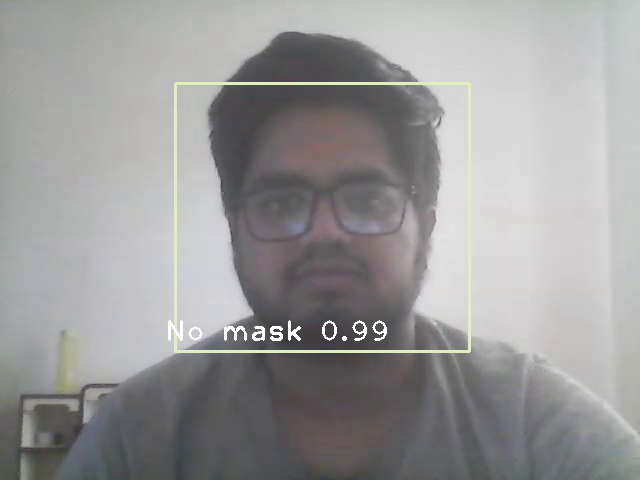

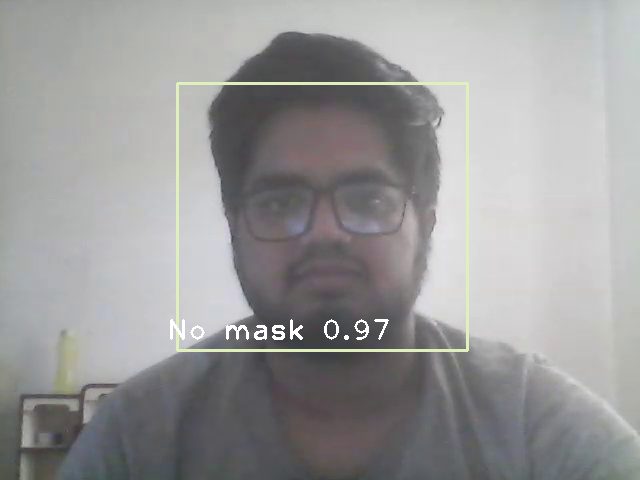

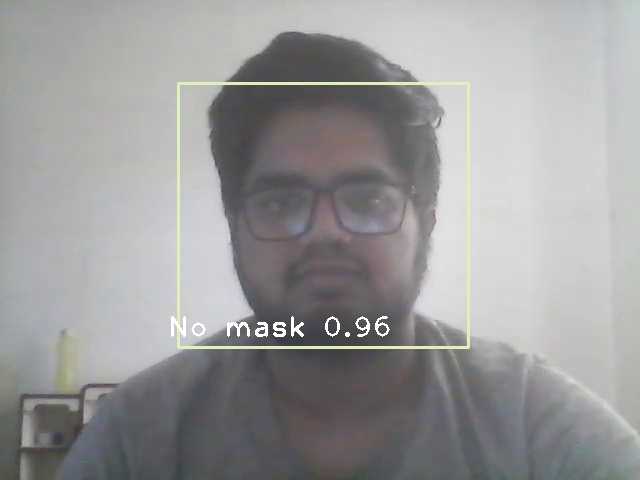

AttributeError: ignored

In [ ]:
net = cv2.dnn.readNet("/content/gdrive/MyDrive/yolov3/yolov3_training_4000.weights", "/content/gdrive/MyDrive/yolov3/yolov3_testing.cfg")

classes = []
with open("/content/gdrive/MyDrive/yolov3/classes.txt", "r") as f:
    classes = f.read().splitlines()

cap = cv2.VideoCapture("/content/gdrive/MyDrive/yolov3/My video - Date (2).mp4")
font = cv2.FONT_HERSHEY_PLAIN
colors = np.random.uniform(0, 255, size=(100, 3))

while True:
    _, img = cap.read()
    height, width, _ = img.shape

    blob = cv2.dnn.blobFromImage(img, 1/255, (416, 416), (0,0,0), swapRB=True, crop=False)
    net.setInput(blob)
    output_layers_names = net.getUnconnectedOutLayersNames()
    layerOutputs = net.forward(output_layers_names)

    boxes = []
    confidences = []
    class_ids = []

    for output in layerOutputs:
        for detection in output:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.2:
                center_x = int(detection[0]*width)
                center_y = int(detection[1]*height)
                w = int(detection[2]*width)
                h = int(detection[3]*height)

                x = int(center_x - w/2)
                y = int(center_y - h/2)

                boxes.append([x, y, w, h])
                confidences.append((float(confidence)))
                class_ids.append(class_id)

    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.2, 0.4)

    if len(indexes)>0:
        for i in indexes.flatten():
            x, y, w, h = boxes[i]
            label = str(classes[class_ids[i]])
            confidence = str(round(confidences[i],2))
            color = colors[i]
            cv2.rectangle(img, (x+10,y+40), (x+w-10, y+h-20), color, 2)
            cv2.putText(img, label + " " + confidence, (x, y+h-30), font, 2, (255,255,255), 2)

    cv2_imshow(img)
    key = cv2.waitKey(1)
    if cv2.waitKey(1) >= 0:
        break

cap.release()
cv2.destroyAllWindows()